In [6]:
from matplotlib import style
from matplotlib.animation import FuncAnimation
from IPython import display
import nm_lib as nm
style.use('dark_background')
import importlib
importlib.reload(nm)

<module 'nm_lib' from '/Users/gauteholen/UiO/AST9110/nm_lib/nm_lib/__init__.py'>

# Operator splitting 

## 1- OS precision

Solve the following Burgers' equation: 

$$\frac{\partial u}{\partial t} = - a \frac{\partial u}{\partial x} - b \frac{\partial u}{\partial x}   \tag{1}$$

following exersize [2b](https://github.com/AST-Course/AST5110/blob/main/ex_2b.ipynb). where $x[x_0, x_f]$ with $x_0 = −2.6$, $x_f = 2.6$, $a=-0.7$ and $b=-0.3$, periodic boundary conditions and with initial condition:

$$u(x,t=t_0) = \cos^2 \left(\frac{6 \pi x}{5} \right) / \cosh(5x^2)  \tag{2}$$

Solve the evolution for the following four different approaches: 

- 1 With additive OS.  

- 2 With Lie-Trotter OS. 

- 3 With Strang OS.

- 4 Without an operator splitting and single time-step method but add the to terms: 

$$\frac{\partial u}{\partial t} = - (a+b) \frac{\partial u}{\partial x}$$

for $nump=256$ and 100 steps.

_Suggestion_: use the Lax-method scheme for all cases with `deriv_cent`. Make sure the boundaries are properly selected.

Fill in the function `osp_LL_Add`, `osp_LL_Lie`, and `osp_LL_Strang`.

Start with $cfl\_cut = 0.4$ and increase up to $0.9$.  

Which OS schemes are stable? Which one is more diffusive? Why?

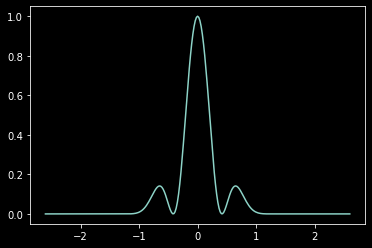

In [7]:
import numpy as np
import matplotlib.pyplot as plt

x0 = -2.6
xf = 2.6
nump = 256

def u_x_t0(xx):
    return np.ma.cos(0.2*6*np.pi*xx)**2/np.cosh(5*xx*xx)

xx = np.linspace(x0,xf,nump+1)
ux_t0 = u_x_t0(xx)

plt.plot(xx,ux_t0)

In [8]:
importlib.reload(nm)

Nt = 64
a = -0.7
b = -0.3
cfl = 0.4

t_A,uunt_A = nm.ops_Lax_LL_Add(xx,ux_t0,Nt,a,b, cfl_cut=cfl)

add OS method


In [9]:
nm.anim(uunt_A,xx,t_A)

In [10]:
importlib.reload(nm)

t_L,uunt_L = nm.ops_Lax_LL_Lie(xx,ux_t0,Nt,a,b, cfl_cut=cfl)
nm.anim(uunt_L,xx,t_L)

Lie OS method


In [11]:
importlib.reload(nm)

t_S,uunt_S = nm.ops_Lax_LL_Strang(xx,ux_t0,Nt,a,b, cfl_cut=cfl)
nm.anim(uunt_S,xx,t_S)

Strang OS method


In [12]:
t_Lax,uunt_Lax = nm.evolv_Lax_adv_burgers(xx,ux_t0,Nt,-(a+b), cfl_cut=cfl)
nm.anim(uunt_Lax,xx,t_Lax)

<span style="color:green">JMS</span>.

<span style="color:red">This should be evolv_Lax_uadv_burgers instead of evolv_Lax_adv_burgers </span>.

In [14]:
importlib.reload(nm)

uts = [uunt_A, uunt_L, uunt_S, uunt_Lax]
lbls = ["Add", "Lie", "Stramg", "Lax"]
styles = ["-", "--", "solid", "-."]
ts = [t_A,t_L,t_S,t_Lax]


nm.animMultTsync(uts,xx,lbls,styles,ts)

In [16]:
uts = [uunt_L, uunt_S, uunt_Lax]
lbls =  ["Lie", "Stramg", "Lax"]
styles = ["--", "solid", "-."]
ts = [t_A,t_S,t_Lax]


nm.animMultTsync(uts,xx,lbls,styles,ts)

In [19]:
importlib.reload(nm)
cfl = 0.9
t_Lax2,uunt_Lax2 = nm.evolv_Lax_adv_burgers(xx,ux_t0,Nt,-a-b, cfl_cut=cfl)
t_S2,uunt_S2 = nm.ops_Lax_LL_Strang(xx,ux_t0,Nt,a,b, cfl_cut=cfl)
t_L2,uunt_L2 = nm.ops_Lax_LL_Lie(xx,ux_t0,Nt,a,b, cfl_cut=cfl)

uts = [uunt_L,uunt_L2, uunt_S,uunt_S2, uunt_Lax, uunt_Lax2]
lbls =  ["Lie cfl 0.4","Lie cfl 0.9", "Strang cfl 0.4","Strang cfl 0.9", "Lax cfl 0.4", "Lax cfl 0.9"]
styles = ["--", "solid","--", "solid","--", "solid"]
ts = [t_L,t_L2,t_S,t_S2,t_Lax,t_Lax2]

nm.animMultTsync(uts,xx,lbls,styles,ts,nt=True)

Strang OS method
Lie OS method


<span style="color:green">JMS</span>.

<span style="color:red">The lax should be evolv_Lax_adv_burgers instad of evolv_Lax_uadv_burgers, right?

# Additive:
Unstable

# Lie
More diffusive than Lax, but less than Strang. Due to 2 steps, so twice as many averages as Lax.

# Strang
The most diffusive. With all the substeps that all involve an average of the neighbours (lax method), we perform a total of 6 averages per timesteps, causing it to be quite diffusive.


# Cfl
Lower CFL causes Lie to be more diffusive. However, it does not affect Strang.

## 2- When does it not work? 

Use OS-Strang from the previous exercise and try to apply a predictor-corrector explicit method. 
To facilitate this exercise, `nm_lib` already includes the predictor-corrector Hyman method, which is included Bifrost (`Hyman`). Fill in the function `osp_Lax_LH_Strang`. Use the same setup as the previous exercise but with $nump=512$, $500$ steps, and $cfl\_cut=0.8$. 

What do you notice? 

__Optional__: Apply the Hyman predictor-corrector explicit method to the Burgers equation and check if the following is true: 

$$u^{n+1} = F\, u^{n}\Delta t \approx G\, u^{n}\Delta t+H\, u^{n}\Delta t$$